In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from numpy.linalg import inv
import math

from scipy.ndimage import zoom, laplace, gaussian_filter, rotate
from scipy import ndimage
from scipy.interpolate import RegularGridInterpolator as RGI
from scipy.interpolate import splprep, splev
from skimage import measure
from skimage.morphology import skeletonize_3d
from skimage.filters import threshold_otsu
from skimage.morphology import skeletonize

import matplotlib.pyplot as plt
from matplotlib.path import Path
from ipywidgets import interact, IntSlider, Layout
import ipyvolume as ipv

import pickle
import csv
import h5py
import pydicom
import json

import os
from tqdm import tqdm
import traceback
import datetime
import copy
import gc
import time
from tqdm import tqdm
import multiprocessing as mp

# Test if gdcm works for decompressing JPEG 2000
print("IT IS {}, GDCM IS LOCKED AND LOADED".format(pydicom.pixel_data_handlers.gdcm_handler.is_available()))

# import cv2
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib
# matplotlib.use('Agg')


IT IS True, GDCM IS LOCKED AND LOADED


In [2]:
# FLOW_PATH = '/media/evmasuta/bigchonk/ayeluru/4d-flow-localization/magdata'
# COMP_PATH = '/media/evmasuta/bigchonk/ayeluru/4d-flow-localization/component_paths'
# ECC_PATH = '/media/evmasuta/hdd/cardiac-ucsd-ecc-npy/'
# PROJECT_PATH = '/home/ayeluru/4d-flow-automation/'

# FLOW_PATH = '/home/ayeluru/4d-flow-automation/bigchonk/magdata'
# COMP_PATH = '/home/ayeluru/4d-flow-automation/bigchonk/component_paths'
# ECC_PATH = '/media/evmasuta/hdd/cardiac-ucsd-ecc-npy/'
# PROJECT_PATH = '/home/ayeluru/4d-flow-automation/ge-testing'

FLOW_PATH = '/home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images'
# COMP_PATH = '/home/ayeluru/4d-flow-automation/bigchonk/component_paths'
ECC_PATH = '/home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/velocities'
PROJECT_PATH = '/home/ayeluru/4d-flow-automation/ge-testing'


OUT_DATA = os.path.join(PROJECT_PATH, 'data')
FLOW_DIRS = os.listdir(FLOW_PATH)
ECC_DIRS = os.listdir(ECC_PATH)

In [3]:
FLOWDATAPATH = '/home/ayeluru/4d-flow-data/volumetric-cardiac-4dflow.hdf5'
FLOWMETAPATH = '/home/ayeluru/4d-flow-data/cardiac-4dflow-metadata.pkl'

flowdata = h5py.File(FLOWDATAPATH, 'a')

with open(FLOWMETAPATH, 'rb') as file:
    metadata = pickle.load(file)

problem_pids = []

for pid in flowdata:
    try:
        for att in metadata[pid]:
            print(pid, att)
            flowdata[pid].attrs[att] = metadata[pid][att]
    except:
        traceback.print_exc()
        problem_pids.append(pid)
    

In [4]:
print(len(ECC_DIRS))

16


for pid in flowdata:
    try:
        print(pid)
        print(flowdata[pid].attrs['A_flow'])
    except:
        traceback.print_exc()

In [ ]:
COORDS = '/home/ayeluru/4d-flow-automation/data/updated data'
OGCOORDS = os.path.join(COORDS, 'rcs_coords_consolidated_updated-9-24-22.pkl')
TUNECOORDS = os.path.join(COORDS, 'rcs_coords_consolidated_updated-9-08-23.pkl')

with open(TUNECOORDS, 'rb') as file:
    cordata_tune = pickle.load(file)
    
with open(OGCOORDS, 'rb') as file:
    cordata_og = pickle.load(file)

In [ ]:
print(len(cordata_tune.keys()))
print(len(cordata_og.keys()))

In [5]:
localization_pids = []
for npy in ECC_DIRS:
    pid = npy[:npy.find('.npy')]
    print(pid)
    localization_pids.append(pid)
    # print(pid, pid in cordata_tune or pid in cordata_og)
    # if pid in cordata_tune or pid in cordata_og:
    #     localization_pids.append(pid)
        
print(len(localization_pids))

Gifice
Finkebet
Bibipnox
Tabipa
Flopika
Dicibi
Hopitat
Jugesag
Nuebafru
Cakimtol
Quakitu
Nesescet
Quequeri
Quisculjug
Petafi
Nosaybos
16


In [ ]:
PID2ACCPATH = '/home/ayeluru/4d-flow-automation/data/updated data/pid2acc_conversion.pkl'
with open(PID2ACCPATH, 'rb') as file:
    pid_accession_dict = pickle.load(file)

In [ ]:
for pid in cordata_og:
    check = pid+'.npy' in ECC_DIRS
    if not check:
        acc = pid_accession_dict['pid_to_a'][pid]
        pids = pid_accession_dict['a_to_pid'][acc[0]]
        
        print(pid, check, pids)

In [6]:
mr_paths = os.listdir(FLOW_PATH)

MR_pids = []
for pid in mr_paths:
    if pid not in MR_pids:
        MR_pids.append(pid)
        print(pid)
        
len(MR_pids)

.DS_Store
Bibipnox
Cakimtol
Dicibi
Finkebet
Flopika
Gifice
Jugesag
Juquoli
Nesescet
Nosaybos
Nuebafru
Petafi
Quakitu
Quequeri
Quisculjug
Tabipa
Hopitat


18

In [7]:
NPPATHS = ECC_PATH
numpy_paths = os.listdir(NPPATHS)

for num, pid in enumerate(localization_pids):
    print(str(num+1), pid,':',pid in MR_pids, pid+'.npy' in numpy_paths)

1 Gifice : True True
2 Finkebet : True True
3 Bibipnox : True True
4 Tabipa : True True
5 Flopika : True True
6 Dicibi : True True
7 Hopitat : True True
8 Jugesag : True True
9 Nuebafru : True True
10 Cakimtol : True True
11 Quakitu : True True
12 Nesescet : True True
13 Quequeri : True True
14 Quisculjug : True True
15 Petafi : True True
16 Nosaybos : True True


In [8]:
numpy_paths = os.listdir(NPPATHS)

for num, numpy in enumerate(numpy_paths):
    path = os.path.join(NPPATHS,numpy)
    temp = np.load(path)
    pid = numpy[:numpy.find('.npy')]
    print(str(num+1), pid,':',temp.shape)

1 Gifice : (20, 3, 160, 192, 256)
2 Finkebet : (30, 3, 100, 256, 178)
3 Bibipnox : (30, 3, 100, 256, 178)
4 Tabipa : (30, 3, 92, 256, 178)
5 Flopika : (30, 3, 112, 256, 178)
6 Dicibi : (30, 3, 104, 256, 152)
7 Hopitat : (20, 3, 112, 384, 512)
8 Jugesag : (20, 3, 120, 204, 256)
9 Nuebafru : (20, 3, 152, 204, 256)
10 Cakimtol : (20, 3, 112, 204, 256)
11 Quakitu : (20, 3, 130, 256, 204)
12 Nesescet : (20, 3, 136, 178, 256)
13 Quequeri : (20, 3, 136, 204, 256)
14 Quisculjug : (20, 3, 160, 204, 256)
15 Petafi : (20, 3, 180, 204, 256)
16 Nosaybos : (20, 3, 150, 204, 256)


In [9]:
flowdata.close()

In [3]:
# OUTPUT = '/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes/volumetric-cardiac-4dflow.hdf5'
# OUTMETA = '/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes/cardiac-4dflow-metadata.pkl'

OUTPUT = os.path.join('/home/ayeluru/4d-flow-automation/ge-testing','ge-volumetric-cardiac-4dflow.hdf5')
OUTMETA = os.path.join('/home/ayeluru/4d-flow-automation/ge-testing', 'ge-cardiac-4dflow-metadata.pkl')

outh5 = h5py.File(OUTPUT, 'r')

try:
    with open(OUTMETA, "rb") as infile: 
        metadict = pickle.load(infile)
except:
    metadict = {}

In [12]:
for key in outh5:
    print(key, outh5[key].shape)

In [13]:
affiliated_dirs = dict()         
""" We build a dictionary mapping each PID to its singular or multiple DICOM dirs; for both flow and cine """
alldicomdirtop = os.listdir(FLOW_PATH)
for d in alldicomdirtop:
    if os.path.isdir(os.path.join(FLOW_PATH, d)):
        if d.find('__') > -1:
            basekey = d[:d.find('__')]
            if not basekey in affiliated_dirs.keys():
                affiliated_dirs[basekey] = [os.path.join(FLOW_PATH, d)]
            else:
                affiliated_dirs[basekey].append(os.path.join(FLOW_PATH, d))
        else:
            affiliated_dirs[d] = [os.path.join(FLOW_PATH, d)]
print(len(affiliated_dirs.keys()))

17


In [14]:
ALL_PIDS = []
npypaths = dict()

eccwalk = os.walk(NPPATHS)
for root, dirs, files in eccwalk:
    for file in files:
        if file[-4:] == '.npy':
            k = file[:-4]
            if k in localization_pids:
                ALL_PIDS.append(k)
                currpath = os.path.join(root,file)
                npypaths[k] = currpath
print(len(ALL_PIDS))
print(len(npypaths))

16
16


In [15]:
for key in ALL_PIDS:
    print(key)

Gifice
Finkebet
Bibipnox
Tabipa
Flopika
Dicibi
Hopitat
Jugesag
Nuebafru
Cakimtol
Quakitu
Nesescet
Quequeri
Quisculjug
Petafi
Nosaybos


In [16]:
def init_flow_meta(indict, netid, affinedict, Nslices, fpath):
    # Build metadata
    indict[netid] = {
        'Representative_dicom': [],
        'A_flow': [],
        'Ainv_flow': [],
        'Row_resolution': [],
        'Column_resolution': [],
        'Slice_thickness': [],
        'Slice_spacing': [],
    }
    currmeta = affinedict['first']
    lastmeta = affinedict['last']
    dircos = currmeta[0x0020,0x0037].value
    F = np.zeros((3,2), dtype=np.float)
    F[:,0] = dircos[3:]
    F[:,1] = dircos[0:3]
    res = currmeta[0x0028,0x0030].value
    rowres = res[0]
    colres = res[1]
    sthick = currmeta[0x0018,0x0050].value 
    normal = np.cross(F[:,0], F[:,1])
    impospt = np.array(currmeta[0x0020,0x0032].value).astype(np.float)
    impospt_last = np.array(lastmeta[0x0020,0x0032].value).astype(np.float)
    slice_spacing = (impospt_last - impospt) / (Nslices - 1)
    A = np.zeros((4,4), dtype=np.float)
    A[3,3] = 1
    A[0:3,0] = rowres * F[:,0]
    A[0:3,1] = colres * F[:,1]
    A[0:3,2] = slice_spacing
    A[0:3,3] = impospt
    Ainv = np.linalg.inv(A)
    indict[netid]['Representative_dicom'] = fpath
    indict[netid]['A_flow'] = A
    indict[netid]['Ainv_flow'] = Ainv
    indict[netid]['Row_resolution'] = rowres
    indict[netid]['Column_resolution'] = colres
    indict[netid]['Slice_thickness'] = sthick
    indict[netid]['Slice_spacing'] = slice_spacing
    return indict

In [17]:
remaining_again = []
for k in tqdm(ALL_PIDS):
    if not k in outh5.keys():
        remaining_again.append(k)
        
print(len(remaining_again))

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 41890.68it/s]

16


In [18]:
print(remaining_again)

['Gifice', 'Finkebet', 'Bibipnox', 'Tabipa', 'Flopika', 'Dicibi', 'Hopitat', 'Jugesag', 'Nuebafru', 'Cakimtol', 'Quakitu', 'Nesescet', 'Quequeri', 'Quisculjug', 'Petafi', 'Nosaybos']


In [19]:
try:
    for k in tqdm(remaining_again):
        # Permit in media res saving
        if not k in outh5.keys():
            try:
                print('NOW PROCESSING {}...'.format(k))
                # TRIGGER FOR 4DFLOW
                flowtrigger = -1
                # TRIGGER to save metadata
                affine_files = dict()
                # Get slice coords for mag file, t=0, slice=0
                scoord_0 = []
                # Get slice coords for mag file, t=0, slice=1
                scoord_1 = []
                # Assumes non-oblique slicing!  Whether slice order is in + or - ImageOrientation dir
                sdir = []
                # Get numpy
                tempnpy = np.load(npypaths[k])
                print('tempnpy.shape',tempnpy.shape)
                SDIM = tempnpy.shape[2]
                TDIM = tempnpy.shape[0]
                # Walk through all affiliated dicom dirs, collect all dicom paths
                allcurrpaths = []
                for topdir in affiliated_dirs[k]:
                    currwalk = os.walk(topdir)
                    for root, dirs, files in currwalk:
                        for file in files:
                            allcurrpaths.append(os.path.join(root, file))
                # Iterate over all paths, check if 4dflow with VENC tag, assemble based on instance number
                for f in allcurrpaths:
                    try:
                        # Exclude prevent-http-timeout files
                        if f[-7:] != 'timeout':
                            # First check if 4dflow
                            flow_check = pydicom.dcmread(f, stop_before_pixels=True)
                            try:
                                # Determines whether valid 4dflow dicom
                                # Vel_X VENC tag is 0x0019, 0x10B3; 0x0043, 0x1030 is GE tag for filetype
                                if flow_check[0x0019, 0x10B3].value > 1 or (flow_check[0x0043,0x1030].value > 1 and flow_check[0x0043,0x1030].value < 6):
                                    # INSTANTIATE HOLDER MATRIX FOR THIS CASE!
                                    if flowtrigger == -1:
                                        print('f',f)
                                        print('flow check:',flow_check[0x0019, 0x10B3].value, flow_check[0x0043,0x1030].value)
                                        pix_read = pydicom.dcmread(f, stop_before_pixels=False)
                                        pix = pix_read.pixel_array
                                        print('pix.shape:',pix.shape)
                                        shp = pix.shape
                                        RDIM = shp[0]
                                        CDIM = shp[1]
                                        flowtrigger = 1
                                        # Channels dim is (mag, rl, ap, si) ~= (mag, x, y, z)
                                        holder = np.zeros((RDIM, CDIM, SDIM, TDIM, 4), dtype=np.int16)
                                        print('holder.shape',holder.shape)
                                    # GET INSTANCE NUMBER <-- 1-indexed
                                    instance_num = flow_check[0x0020,0x0013].value - 1
                                    # get indices for stash
                                    tidx = int( instance_num % TDIM )
                                    sidx = int( np.floor(instance_num / TDIM) )

                                    # Check if we can save meta
                                    if tidx == 0:
                                        if sidx == 0 or sidx == SDIM - 1:
                                            if sidx == 0:
                                                affine_files['first'] = flow_check
                                            else:
                                                affine_files['last'] = flow_check
                                            if len(affine_files.keys()) == 2 and k not in metadict.keys():
                                                init_flow_meta(metadict, k, affine_files, SDIM, f)
                                    # GET FLOW DIRECTION
                                    flow_dir = flow_check[0x0043,0x1030].value
                                    # Stash
                                    didx = -1
                                    # Mag
                                    if flow_dir == 2:
                                        didx = 0
                                        # Get slice order information for slice 0, time 0
                                        if sidx == 0 and tidx == 0:
                                            # Get image orientation patient
                                            im_orient = flow_check[0x0020,0x0037].value
                                            y_cos = np.array(im_orient[3:])
                                            x_cos = np.array(im_orient[0:3])
                                            scoord_0 = np.array(flow_check[0x0020,0x0032].value)
                                            sdir = np.cross(x_cos, y_cos)
                                        # Do same for slice 1, time 0
                                        if sidx == 1 and tidx == 0:
                                            scoord_1 = np.array(flow_check[0x0020,0x0032].value)
                                    # rl
                                    elif flow_dir == 3:
                                        didx = 1
                                    # ap
                                    elif flow_dir == 4:
                                        didx = 2
                                    # si
                                    elif flow_dir == 5:
                                        didx = 3
    #                                 # cd: purely for storage purposes
    #                                 elif flow_dir == 7:
    #                                     json_storage[k]['type'].append('cd')
                                    if didx > -1:
                                        pix_read = pydicom.dcmread(f, stop_before_pixels=False)
                                        pix = pix_read.pixel_array
                                        holder[:,:,sidx,tidx,didx] = pix
                            except:
                                traceback.print_exc()
                    except:
                        traceback.print_exc()
                """ 
                Now we need to organize thenumpy array.  Let's first figure out if the slice order is reversed.
                Assuming a non-oblique plane, we sum over sdir to see whether we are marching in the + or - direction
                in global Cartesian coordinates.  We next find the difference in global position by calculating
                scoord_1 - s_coord0.  We sum this too.  If this difference has the same sign as the sum of sdir, we are
                golden, otherwise, the order is inverted.  Since we will need to re-upload to Arterys, we need to match
                to the DICOM coordinate system, so we flip the numpy.  Also note that we must negate the si component, as
                Arterys converts to inferior-superior when generating the numpy array.
                """
                print('scoord1-scoord2 =',np.array(scoord_1), np.array(scoord_0))
                delta = np.sum(np.array(scoord_1) - np.array(scoord_0))

                sdir_sum = np.sum(np.array(sdir))
                if delta / sdir_sum > 0:
                    FLIP_FLAG = 0
                else:
                    FLIP_FLAG = 1
                """
                As mentioned previously, Artery ECC files are (time, component, slice, row, col).  We need to do 4 things:
                1) Swap axes to match holder
                2) Pad rows and/or cols appropriately
                3) Flip over slice IF NECESSARY
                4) Negate the si component
                """
                # Step 1: now (row, component, slice, time, col)
                tempnpy = np.swapaxes(tempnpy, 0, 3)
                # now (row, col, slice, time, component)
                tempnpy = np.swapaxes(tempnpy, 1, 4)
                # Step 2: note ecc only has 3 components, since mag is the same
                ecc_holder = np.zeros((RDIM, CDIM, SDIM, TDIM, 3), dtype=np.int16)
                RDIM_npy = tempnpy.shape[0]
                CDIM_npy = tempnpy.shape[1]
                Rspacer = (RDIM - RDIM_npy) // 2
                Cspacer = (CDIM - CDIM_npy) // 2
                ecc_holder[Rspacer:Rspacer+RDIM_npy, Cspacer:Cspacer+CDIM_npy, :, :, :] = np.copy(tempnpy)
                # Step 3
                if FLIP_FLAG == 1:
                    print(k,'ecc needs to flip')
                    ecc_holder = np.flip(ecc_holder, axis=2)
                # Step 4
                ecc_holder[:,:,:,:,2] = -ecc_holder[:,:,:,:,2]
                # We really don't need the uncorrected non-mag data, so we discard here
                holder[...,1:] = ecc_holder


                affine = np.array(metadict[k]['A_flow'])
                inv_affine = np.array(metadict[k]['Ainv_flow'])
                curr_dict = copy.deepcopy(metadict[k])

                imgshp = holder.shape
                imaging_orientation = 'axial'
                direction = 'correct'
                if affine[2,2] >0:
                    direction = 'flipped'
                if affine[2,2] == 0:
                    imaging_orientation = 'sagital'
    #                 print(k,'everything need to flip')
    #                 flip_affine = np.zeros((4,4))
    #                 for i in range(4):
    #                     flip_affine[i,i] = 1
    #                 flip_affine[2,2] = -1
    #                 flip_affine[2,3] = imgshp[2]
    #                 A_flow = np.matmul(affine,flip_affine)
    #                 Ainv_flow = linalg.inv(A_flow)
    #                 curr_dict['A_flow'] = A_flow
    #                 curr_dict['Ainv_flow'] = Ainv_flow
    #                 curr_dict['A_flow_old'] = affine
    #                 curr_dict['Ainv_flow_old'] = inv_affine
    #                 curr_dict['flip_affine'] = flip_affine

    #                 holder = np.flip(holder, axis=2)
    #                 metadict[k] = curr_dict

                try:
                    del outh5[k] # <-- overwrites
                except:
                    pass
                outh5.create_dataset(k, data=holder, dtype=np.int16, compression='lzf')
                outh5[k].attrs['orientation'] = imaging_orientation
                outh5[k].attrs['direction'] = direction
                outh5[k].attrs['A_flow'] = affine
                outh5[k].attrs['Ainv_flow'] = inv_affine
                for att in metadict[k]:
                    outh5[k].attrs[att] = metadict[k][att]

                print('SUCCESS AT {}'.format(k))
            except:
                print('FAILURE AT {}'.format(k))
                traceback.print_exc()
        else:
            print('Skipping {}, already in database'.format(k))

    """ WRITE TO JSON AND CLOSE HDF5 """
     
finally:
    outh5.close()
    with open(OUTMETA, "wb") as outfile: 
        pickle.dump(metadict, outfile)


  0%|                                                                                                                                    | 0/16 [00:00<?, ?it/s]

NOW PROCESSING Gifice...
tempnpy.shape (20, 3, 160, 192, 256)


Traceback (most recent call last):
  File "/tmp/ipykernel_1174516/1415850567.py", line 35, in <module>
    flow_check = pydicom.dcmread(f, stop_before_pixels=True)
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/pydicom/filereader.py", line 1026, in dcmread
    specific_tags=specific_tags,
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/pydicom/filereader.py", line 778, in read_partial
    preamble = read_preamble(fileobj, force)
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/pydicom/filereader.py", line 724, in read_preamble
    "File is missing DICOM File Meta Information header or the 'DICM' "
pydicom.errors.InvalidDicomError: File is missing DICOM File Meta Information header or the 'DICM' prefix is missing from the header. Use force=True to force reading.


f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Gifice/2900_p324_e377_s15343_i8299982.MRDC.1215
flow check: 0.000000 2
pix.shape: (256, 256)
holder.shape (256, 256, 160, 20, 4)


/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/ipykernel_launcher.py:15: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  from ipykernel import kernelapp as app
/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/ipykernel_launcher.py:23: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/home/a

scoord1-scoord2 = [-184.323  -211.758    40.1435] [-184.323  -211.758    38.7435]



  6%|███████▌                                                                                                                 | 1/16 [04:21<1:05:25, 261.67s/it]

SUCCESS AT Gifice
NOW PROCESSING Finkebet...
tempnpy.shape (30, 3, 100, 256, 178)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Finkebet/up-5f880fc6c037d90820c32cea/up-5f880fc6c037d90820c32cea/60.dcm
flow check: 0.000000 3
pix.shape: (256, 256)
holder.shape (256, 256, 100, 30, 4)
scoord1-scoord2 = [ 102.938 -199.297  170.156] [ 104.438 -199.297  170.156]



 12%|███████████████▏                                                                                                         | 2/16 [08:58<1:03:05, 270.37s/it]

SUCCESS AT Finkebet
NOW PROCESSING Bibipnox...
tempnpy.shape (30, 3, 100, 256, 178)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Bibipnox/up-5f7b821ca24f4b07b819c850/up-5f7b821ca24f4b07b819c850/0.dcm
flow check: 0.000000 2
pix.shape: (256, 256)
holder.shape (256, 256, 100, 30, 4)
scoord1-scoord2 = [  91.9556 -183.546   237.332 ] [  93.4556 -183.546   237.332 ]



 19%|███████████████████████                                                                                                    | 3/16 [13:20<57:49, 266.89s/it]

SUCCESS AT Bibipnox
NOW PROCESSING Tabipa...
tempnpy.shape (30, 3, 92, 256, 178)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Tabipa/up-60106796cab2be7b6c683a5f/up-60106796cab2be7b6c683a5f/0.dcm
flow check: 0.000000 2
pix.shape: (256, 256)
holder.shape (256, 256, 92, 30, 4)
scoord1-scoord2 = [  57.1877 -176.453   230.469 ] [ 102.188 -176.453  230.469]



 25%|██████████████████████████████▊                                                                                            | 4/16 [17:14<50:43, 253.62s/it]

SUCCESS AT Tabipa
NOW PROCESSING Flopika...
tempnpy.shape (30, 3, 112, 256, 178)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Flopika/up-601b2391ba97e207d318c6f8/up-601b2391ba97e207d318c6f8/0.dcm
flow check: 0.000000 2
pix.shape: (256, 256)
holder.shape (256, 256, 112, 30, 4)
scoord1-scoord2 = [  93.1877 -191.875   187.383 ] [  94.6877 -191.875   187.383 ]



 31%|██████████████████████████████████████▍                                                                                    | 5/16 [22:10<49:17, 268.91s/it]

SUCCESS AT Flopika
NOW PROCESSING Dicibi...
tempnpy.shape (30, 3, 104, 256, 152)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Dicibi/up-601b3aab05271007dc7d2654/up-601b3aab05271007dc7d2654/0.dcm
flow check: 0.000000 2
pix.shape: (256, 256)
holder.shape (256, 256, 104, 30, 4)
scoord1-scoord2 = [  90.0002 -196.906   194.297 ] [  91.5002 -196.906   194.297 ]



 38%|██████████████████████████████████████████████▏                                                                            | 6/16 [26:49<45:23, 272.38s/it]

SUCCESS AT Dicibi
NOW PROCESSING Hopitat...
tempnpy.shape (20, 3, 112, 384, 512)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Hopitat/00005499/AADA00D9/AAAB7BE3/0000EAAE/EE75C97D
flow check: 0.000000 4
pix.shape: (512, 512)
holder.shape (512, 512, 112, 20, 4)
scoord1-scoord2 = [-184.24   -230.879    20.4929] [-184.24   -230.879    19.0929]



 44%|█████████████████████████████████████████████████████▊                                                                     | 7/16 [37:22<58:33, 390.42s/it]

SUCCESS AT Hopitat
NOW PROCESSING Jugesag...
tempnpy.shape (20, 3, 120, 204, 256)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Jugesag/2.25.153627682227095009235267042886953205093/2.25.197731366572900786588014681372397842891/2.25.10026645580439822032447011003676628350.dcm
flow check: 0.000000 4
pix.shape: (256, 256)
holder.shape (256, 256, 120, 20, 4)
scoord1-scoord2 = [-179.307  -215.297   -39.6392] [-179.307  -215.297   -41.0392]



 50%|█████████████████████████████████████████████████████████████▌                                                             | 8/16 [41:15<45:21, 340.15s/it]

SUCCESS AT Jugesag
NOW PROCESSING Nuebafru...
tempnpy.shape (20, 3, 152, 204, 256)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Nuebafru/2.25.30439414430395923499043587477016870194/2.25.108038654522653382119333588122869360465/2.25.100000895294527399971887492787803400886.dcm
flow check: 0.000000 4
pix.shape: (256, 256)
holder.shape (256, 256, 152, 20, 4)
scoord1-scoord2 = [-193.359  -230.922    30.8123] [-193.359   -230.922      2.81226]



 56%|█████████████████████████████████████████████████████████████████████▏                                                     | 9/16 [46:42<39:11, 335.97s/it]

SUCCESS AT Nuebafru
NOW PROCESSING Cakimtol...
tempnpy.shape (20, 3, 112, 204, 256)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Cakimtol/2.25.27977418077265153039633136862509549341/2.25.146521212288545576398429457114084897403/2.25.100130400714993410608100857888545636611.dcm
flow check: 0.000000 4
pix.shape: (256, 256)
holder.shape (256, 256, 112, 20, 4)
scoord1-scoord2 = [-186.71  -212.759 -101.884] [-186.71  -212.759 -129.884]



 62%|████████████████████████████████████████████████████████████████████████████▎                                             | 10/16 [50:37<30:29, 304.85s/it]

SUCCESS AT Cakimtol
NOW PROCESSING Quakitu...
tempnpy.shape (20, 3, 130, 256, 204)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Quakitu/2.25.38154503167734817679378590179263627158/2.25.13883490529655181191305502058761145942/2.25.100030663595068162436460135222559063446.dcm
flow check: 0.000000 5
pix.shape: (256, 256)
holder.shape (256, 256, 130, 20, 4)
scoord1-scoord2 = [ 122.89164734 -190.99409485  266.99951172] [ 124.39164734 -190.99409485  266.99951172]



 69%|███████████████████████████████████████████████████████████████████████████████████▉                                      | 11/16 [54:49<24:04, 288.81s/it]

SUCCESS AT Quakitu
NOW PROCESSING Nesescet...
tempnpy.shape (20, 3, 136, 178, 256)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Nesescet/2.25.114047137340447154137564296933086261008/2.25.144744853222956599604211211199791651913/2.25.100057926699371813968647650996728030767.dcm
flow check: 0.000000 4
pix.shape: (256, 256)
holder.shape (256, 256, 136, 20, 4)
scoord1-scoord2 = [-185.038  -183.409   -39.4954] [-185.038  -183.409   -40.8954]



 75%|███████████████████████████████████████████████████████████████████████████████████████████▌                              | 12/16 [59:16<18:48, 282.13s/it]

SUCCESS AT Nesescet
NOW PROCESSING Quequeri...
tempnpy.shape (20, 3, 136, 204, 256)


Traceback (most recent call last):
  File "/tmp/ipykernel_1174516/1415850567.py", line 35, in <module>
    flow_check = pydicom.dcmread(f, stop_before_pixels=True)
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/pydicom/filereader.py", line 1026, in dcmread
    specific_tags=specific_tags,
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/pydicom/filereader.py", line 778, in read_partial
    preamble = read_preamble(fileobj, force)
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/pydicom/filereader.py", line 724, in read_preamble
    "File is missing DICOM File Meta Information header or the 'DICM' "
pydicom.errors.InvalidDicomError: File is missing DICOM File Meta Information header or the 'DICM' prefix is missing from the header. Use force=True to force reading.


f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Quequeri/2.25.243563111192840930417641451924987169397/2.25.147034126652785198451437407008608032588/2.25.100092053130847123344565122065028224495.dcm
flow check: 0.000000 3
pix.shape: (256, 256)
holder.shape (256, 256, 136, 20, 4)
scoord1-scoord2 = [-189.609   -218.984     -3.92525] [-189.609  -218.984   -31.9252]



 81%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 13/16 [1:03:50<13:58, 279.55s/it]

SUCCESS AT Quequeri
NOW PROCESSING Quisculjug...
tempnpy.shape (20, 3, 160, 204, 256)


Traceback (most recent call last):
  File "/tmp/ipykernel_1174516/1415850567.py", line 35, in <module>
    flow_check = pydicom.dcmread(f, stop_before_pixels=True)
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/pydicom/filereader.py", line 1026, in dcmread
    specific_tags=specific_tags,
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/pydicom/filereader.py", line 778, in read_partial
    preamble = read_preamble(fileobj, force)
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/pydicom/filereader.py", line 724, in read_preamble
    "File is missing DICOM File Meta Information header or the 'DICM' "
pydicom.errors.InvalidDicomError: File is missing DICOM File Meta Information header or the 'DICM' prefix is missing from the header. Use force=True to force reading.


f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Quisculjug/2.25.135547543655960086610805187293958197014/2.25.214458021771662490373137293811590055161/2.25.100007890085477749588878729802010625260.dcm
flow check: 0.000000 2
pix.shape: (256, 256)
holder.shape (256, 256, 160, 20, 4)
scoord1-scoord2 = [-191.082  -215.572   -14.0053] [-191.082  -215.572   -42.0053]



 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████               | 14/16 [1:09:51<10:08, 304.26s/it]

SUCCESS AT Quisculjug
NOW PROCESSING Petafi...
tempnpy.shape (20, 3, 180, 204, 256)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Petafi/2.25.283204237269252592925929785136548986241/2.25.133816432408480069539044893630947671268/2.25.100065987559755650130963761524841178546.dcm
flow check: 350.000000 2
pix.shape: (256, 256)
holder.shape (256, 256, 180, 20, 4)
scoord1-scoord2 = [-176.751  -208.697   -58.4591] [-176.751  -208.697   -59.8591]



 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 15/16 [1:20:48<06:50, 410.68s/it]

SUCCESS AT Petafi
NOW PROCESSING Nosaybos...
tempnpy.shape (20, 3, 150, 204, 256)
f /home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/unzipped_images/Nosaybos/2.25.254680958135152366157438250782366023272/2.25.128657126290279169568296063513093257688/2.25.100318336258988068644072536733790011980.dcm
flow check: 0.000000 2
pix.shape: (256, 256)
holder.shape (256, 256, 150, 20, 4)
scoord1-scoord2 = [-157.55450439 -196.40576172  -16.37291718] [-157.55450439 -196.40576172  -46.37291718]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [1:25:49<00:00, 321.83s/it]

SUCCESS AT Nosaybos


In [19]:
outh5.close()

In [33]:
outh5 = h5py.File(OUTPUT, 'a')

In [34]:
len(outh5.keys())

16

In [35]:
we_have = [key for key in localization_pids if key in outh5]
print(len(we_have))
print(len(localization_pids))

16
16


In [ ]:
# print(remaining)

In [36]:
for key in outh5:
    print(key, outh5[key].shape)

Bibipnox (256, 256, 100, 30, 4)
Cakimtol (256, 256, 112, 20, 4)
Dicibi (256, 256, 104, 30, 4)
Finkebet (256, 256, 100, 30, 4)
Flopika (256, 256, 112, 30, 4)
Gifice (256, 256, 160, 20, 4)
Hopitat (512, 512, 112, 20, 4)
Jugesag (256, 256, 120, 20, 4)
Nesescet (256, 256, 136, 20, 4)
Nosaybos (256, 256, 150, 20, 4)
Nuebafru (256, 256, 152, 20, 4)
Petafi (256, 256, 180, 20, 4)
Quakitu (256, 256, 130, 20, 4)
Quequeri (256, 256, 136, 20, 4)
Quisculjug (256, 256, 160, 20, 4)
Tabipa (256, 256, 92, 30, 4)


In [ ]:
for key in outh5:
    try:
        affine = np.array(outh5[key].attrs['A_flow'])
        imaging_orientation = 'axial'
        direction = 'correct'
        if affine[2,2] >0:
            direction = 'flipped'
        if affine[2,2] == 0:
            imaging_orientation = 'sagital'
            
        outh5[key].attrs['orientation'] = imaging_orientation
        outh5[key].attrs['direction'] = direction
        print(key,outh5[key].shape, outh5[key].attrs['direction'], outh5[key].attrs['orientation'])
    except:
        print(key,outh5[key].shape,'error')

In [ ]:
count = 0
for key in outh5:
    try:
        if outh5[key].attrs['loc-net_anno']:
            count+=1
            print(count,key,outh5[key].shape, outh5[key].attrs['loc-net_anno'], outh5[key].attrs['loc-net_anno-group'])
    except:
        traceback.print_exc()
        print(key,outh5[key].shape,'error')

In [ ]:
outh5.close()

In [ ]:
pid ='Bonmosin'

for z in range(outh5[pid].shape[2]):
    plt.figure()
    plt.title(z)
    
    plt.imshow(np.array(outh5[pid][...,z,3,0]), cmap='gray')

In [ ]:
%matplotlib inline

for key in outh5:
    try:
        img = outh5[key]
        plt.figure()
        plt.suptitle(key)
        if 'A_flow_old' in metadict[key]:
            plt.suptitle(key+' - flipped')

        print(key)
        print(metadict[key]['A_flow'])
        
        z_total = img.shape[2]
        num = 9
        z_inc = math.floor(z_total/num)
        
        for i in range(0,num):            
            ax = plt.subplot(3,3,i+1)
            ax.imshow(img[:,:,z_inc*i,0,0], cmap='gray')

    except:
        traceback.print_exc()
        pass

Bibipnox
[[  -0.       -0.       -1.5      93.4556]
 [  -0.        1.4063    0.     -183.546 ]
 [  -1.4063    0.        0.      237.332 ]
 [   0.        0.        0.        1.    ]]
Cakimtol
[[  -0.           1.4063       0.        -186.71     ]
 [   1.4063      -0.           0.        -212.759    ]
 [   0.           0.           1.4000018 -129.884    ]
 [   0.           0.           0.           1.       ]]
Dicibi
[[  -0.       -0.       -1.5      91.5002]
 [  -0.        1.4063    0.     -196.906 ]
 [  -1.4063    0.        0.      194.297 ]
 [   0.        0.        0.        1.    ]]
Finkebet
[[  -0.           -0.           -1.50000303  104.438     ]
 [  -0.            1.4063        0.         -199.297     ]
 [  -1.4063        0.            0.          170.156     ]
 [   0.            0.            0.            1.        ]]
Flopika
[[  -0.       -0.       -1.5      94.6877]
 [  -0.        1.4063    0.     -191.875 ]
 [  -1.4063    0.        0.      187.383 ]
 [   0.        0.        

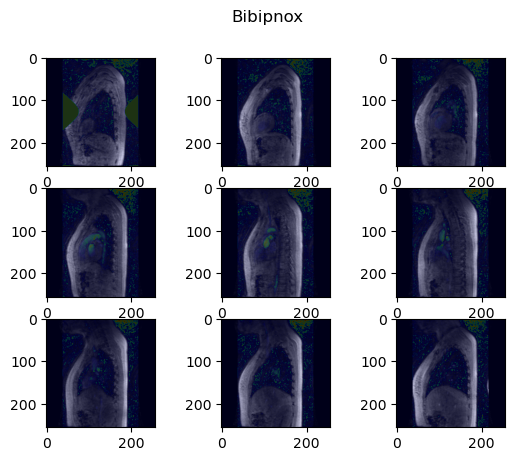

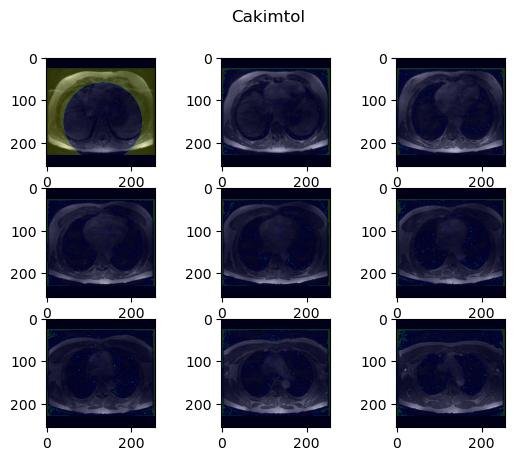

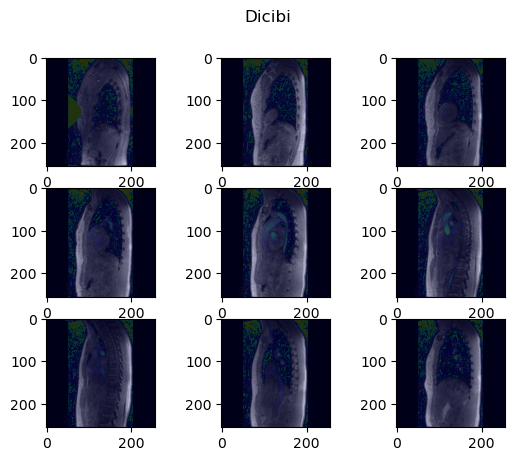

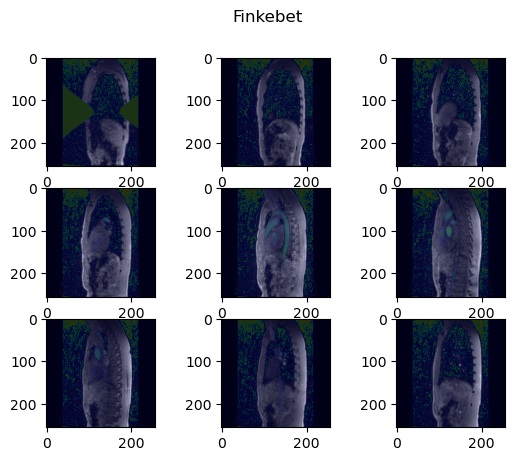

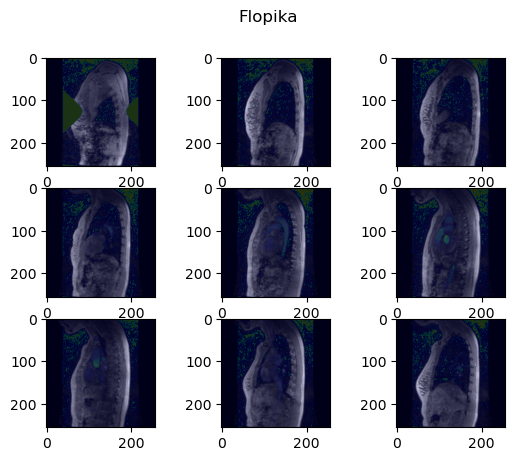

...

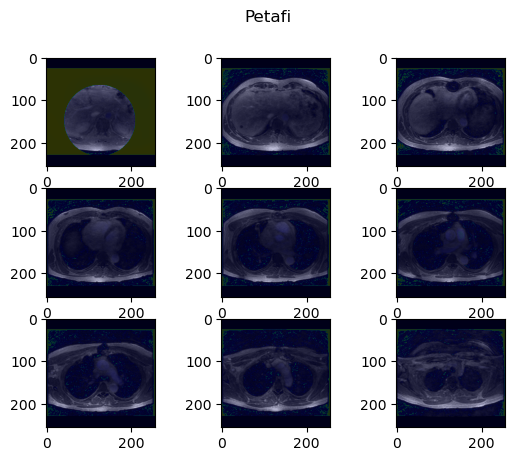

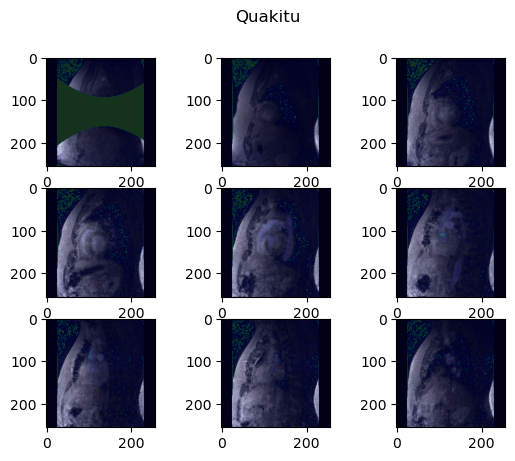

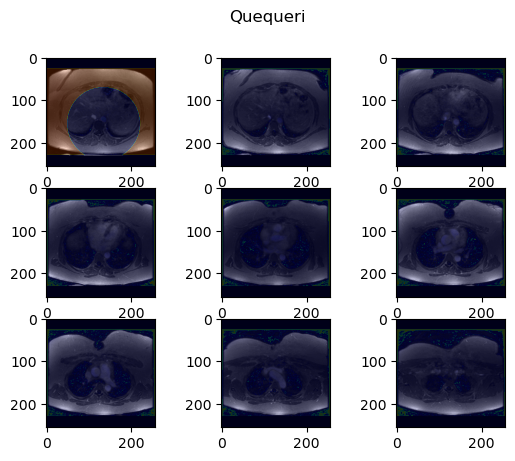

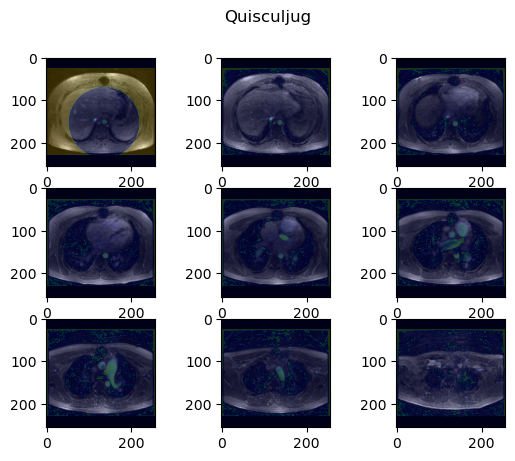

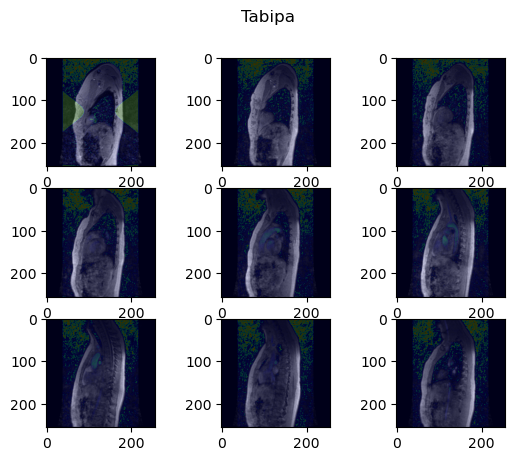

In [37]:
%matplotlib inline

for key in outh5:
    try:
        img = outh5[key]
        time =5
        spd = np.sqrt(img[...,time,1].astype('float')**2 + img[...,time,2].astype('float')**2 + img[...,time,3].astype('float')**2)

        plt.figure()
        plt.suptitle(key)
        if 'A_flow_old' in metadict[key]:
            plt.suptitle(key+' - flipped')
            
        print(key)
        print(metadict[key]['A_flow'])
        
        z_total = img.shape[2]
        num = 9
        z_inc = math.floor(z_total/num)
        
        for i in range(0,num):            
            ax = plt.subplot(3,3,i+1)
            ax.imshow(img[:,:,z_inc*i,time,0], cmap='gray')
            ax.imshow(spd[:,:,z_inc*i], cmap='jet', alpha=0.2)

    except:
        traceback.print_exc()
        pass

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math
import traceback

%matplotlib inline

# for key in outh5:
key = 'Nuebafru'
img = outh5[key]

shp = img.shape
RDIM = shp[0]
CDIM = shp[1]

ECC_PATH = '/home/ayeluru/mnt/maxwell/projects/Aorta_pulmonary_artery_localization/ge_testing/velocities'

this_nmpy = np.load(os.path.join(ECC_PATH, key+'.npy'))

SDIM = this_nmpy.shape[2]
TDIM = this_nmpy.shape[0]
                    
print(this_nmpy.shape)

# Step 1: now (row, component, slice, time, col)
this_nmpy = np.swapaxes(this_nmpy, 0, 3)
# now (row, col, slice, time, component)
this_nmpy = np.swapaxes(this_nmpy, 1, 4)
# Step 2: note ecc only has 3 components, since mag is the same
ecc_holder = np.zeros((RDIM, CDIM, SDIM, TDIM, 3), dtype=np.int16)
RDIM_npy = this_nmpy.shape[0]
CDIM_npy = this_nmpy.shape[1]
Rspacer = (RDIM - RDIM_npy) // 2
Cspacer = (CDIM - CDIM_npy) // 2
ecc_holder[Rspacer:Rspacer+RDIM_npy, Cspacer:Cspacer+CDIM_npy, :, :, :] = np.copy(this_nmpy)

print(ecc_holder.shape)

(20, 3, 152, 204, 256)
(256, 256, 152, 20, 3)


In [17]:
print(img.shape)

(256, 256, 152, 20, 4)


<IPython.core.display.Javascript object>


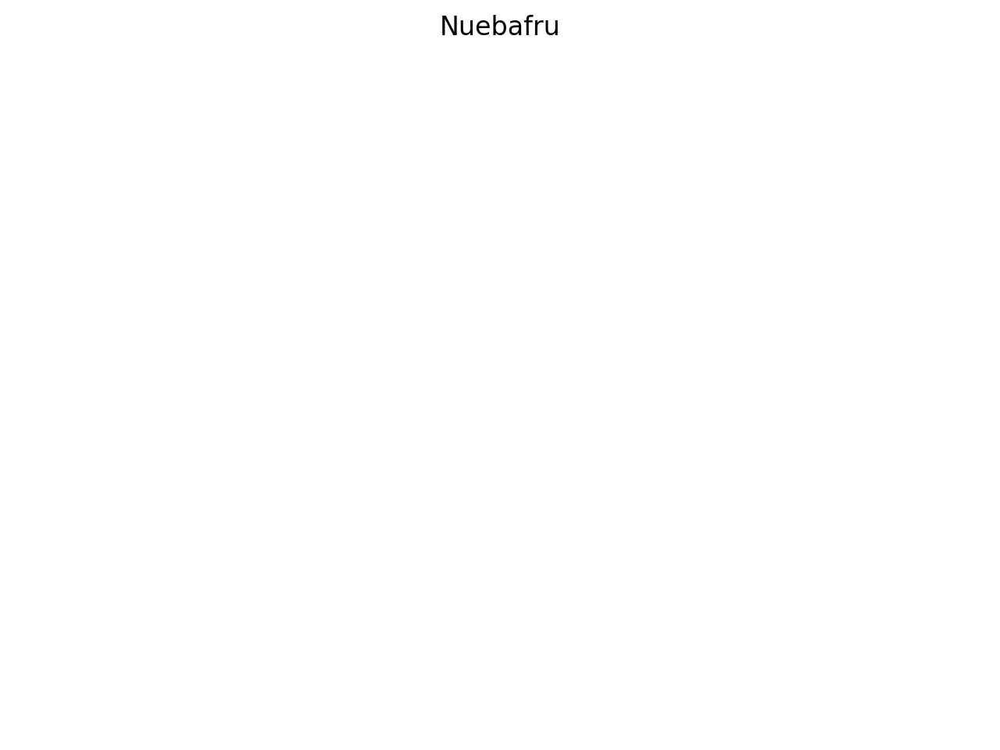

Nuebafru
[[  -0.            1.4063        0.         -193.359     ]
 [   1.4063       -0.            0.         -230.922     ]
 [   0.            0.            1.39999828    2.81226   ]
 [   0.            0.            0.            1.        ]]


<IPython.core.display.Javascript object>


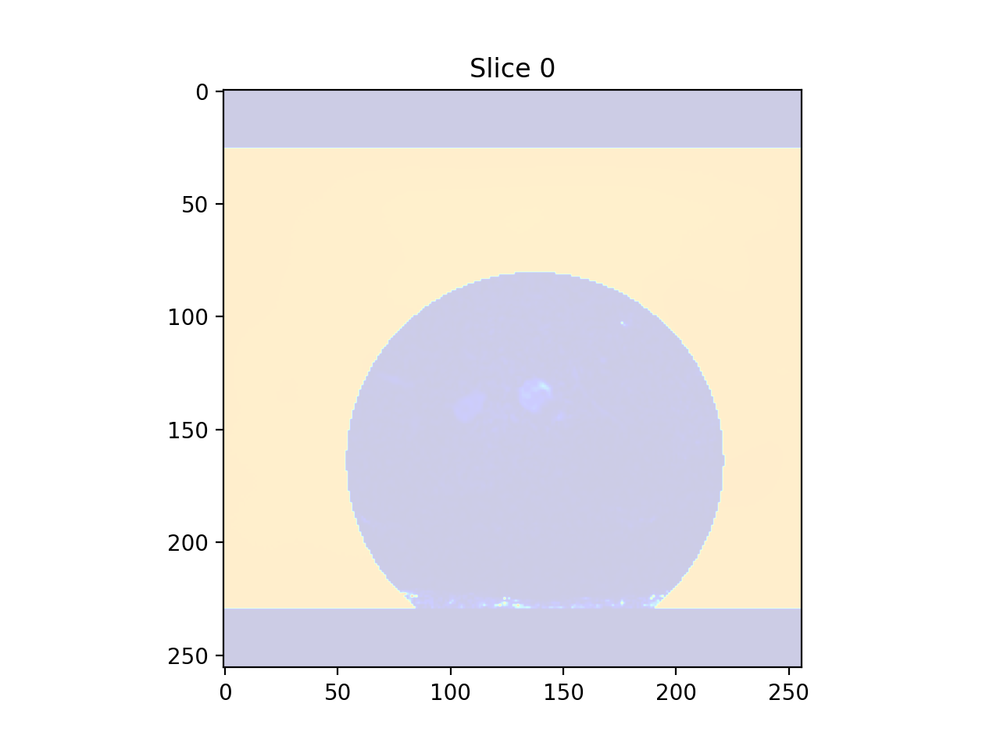

<IPython.core.display.Javascript object>


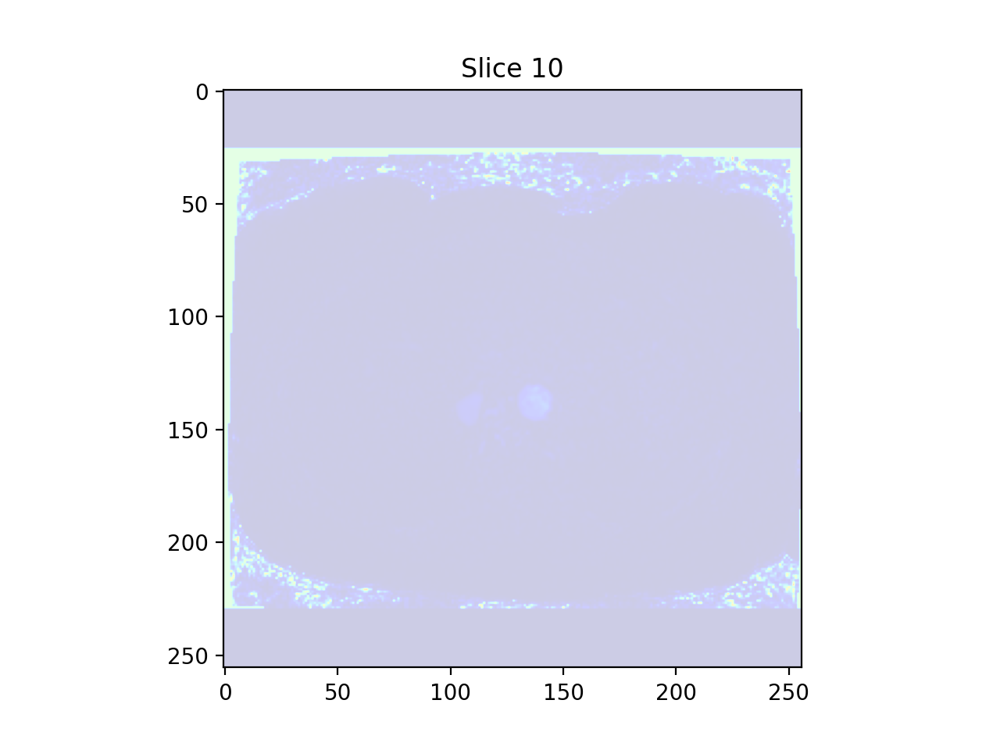

<IPython.core.display.Javascript object>


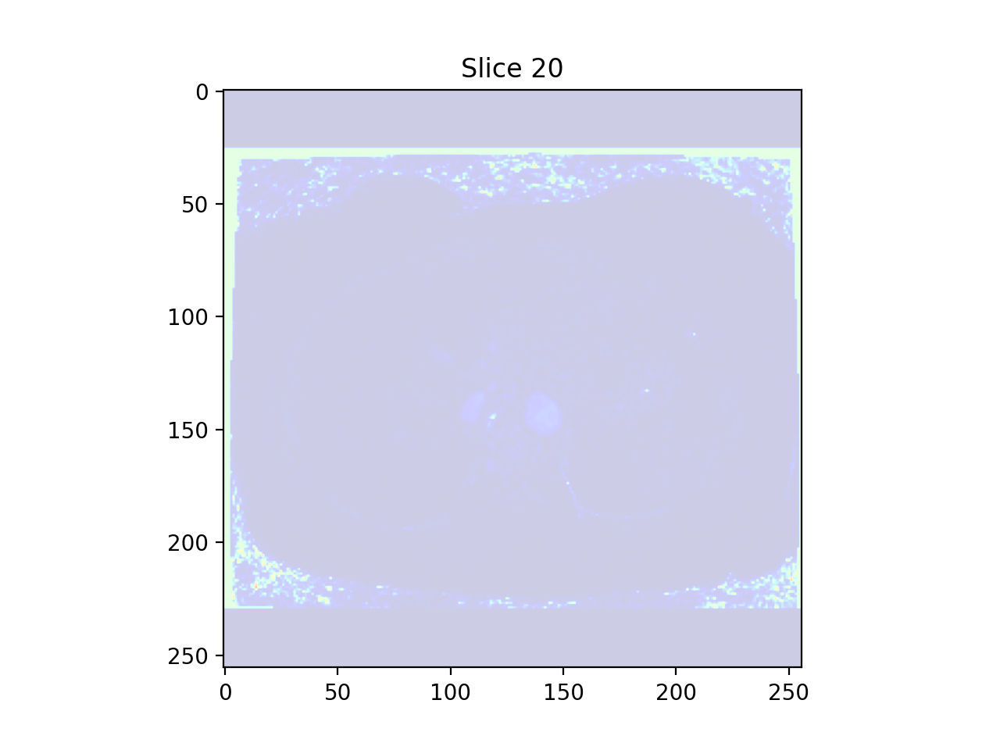

<IPython.core.display.Javascript object>


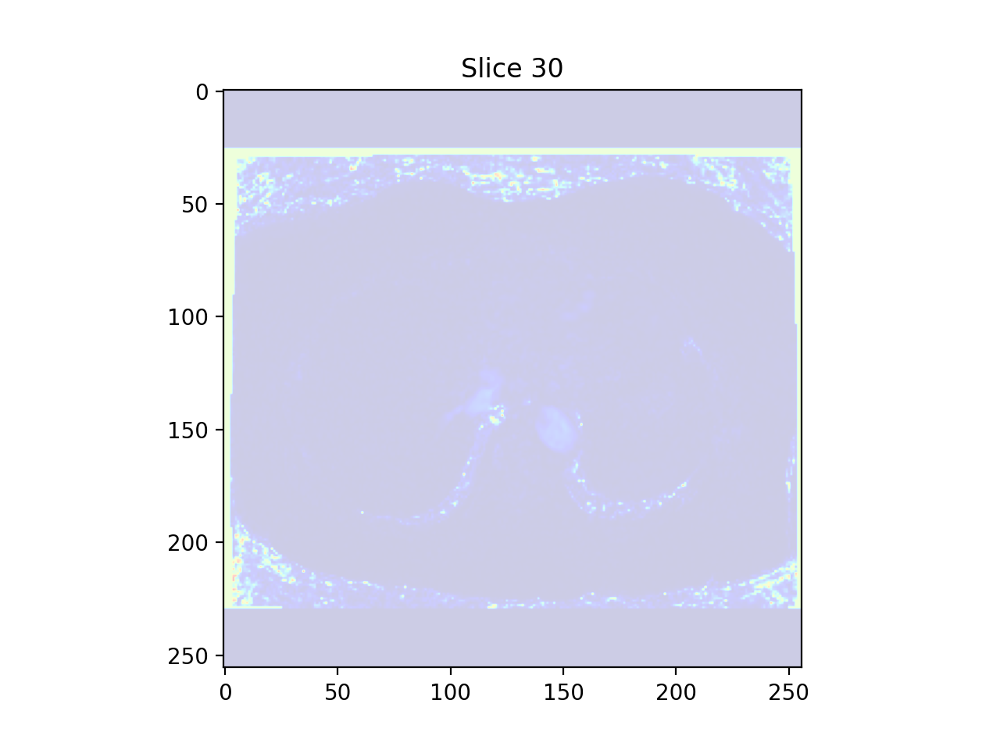

<IPython.core.display.Javascript object>


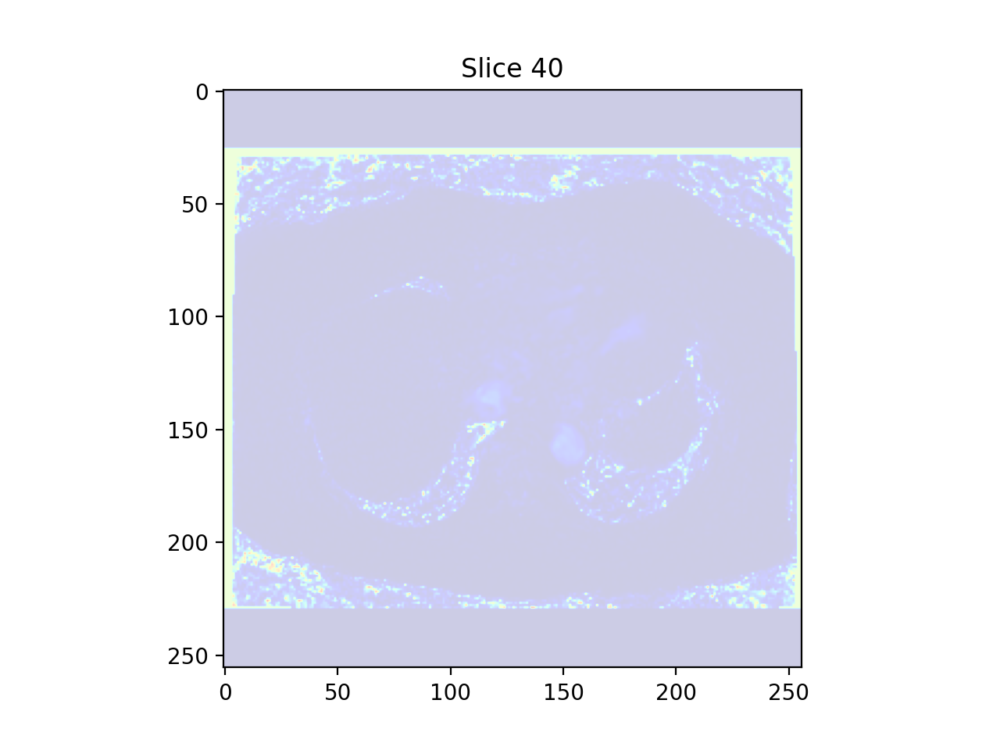

<IPython.core.display.Javascript object>


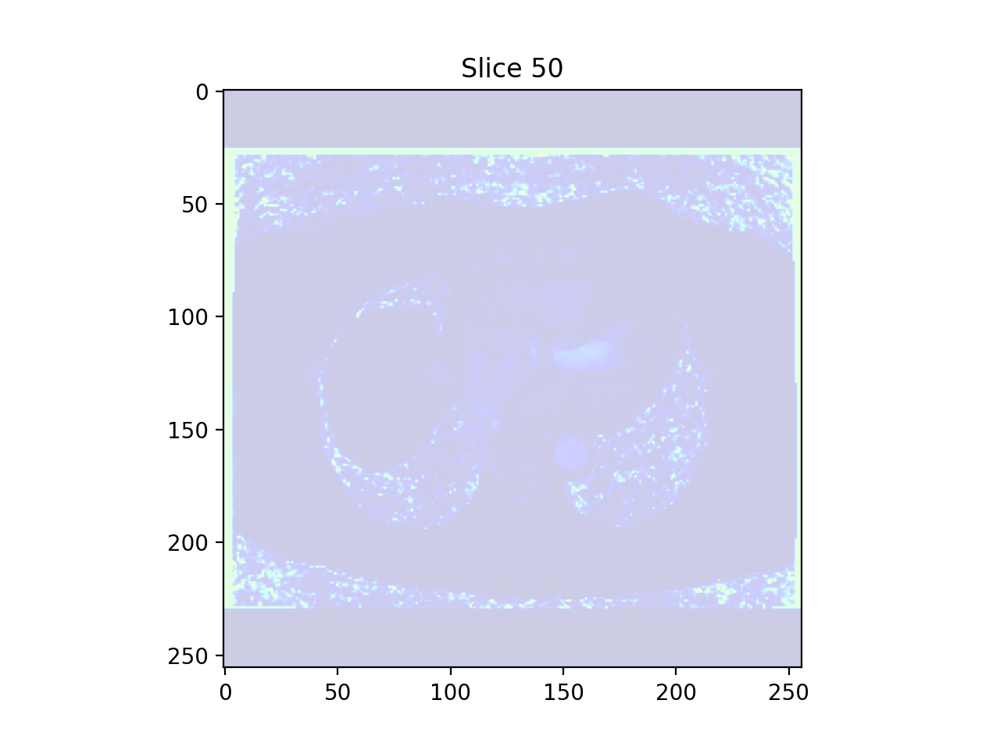

<IPython.core.display.Javascript object>


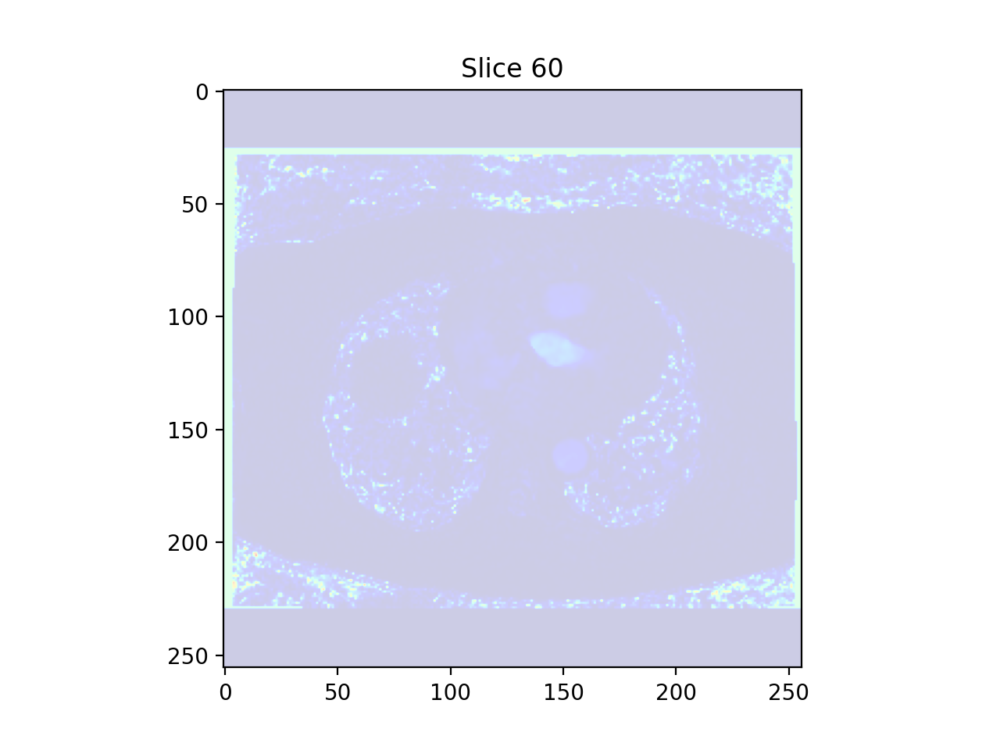

<IPython.core.display.Javascript object>


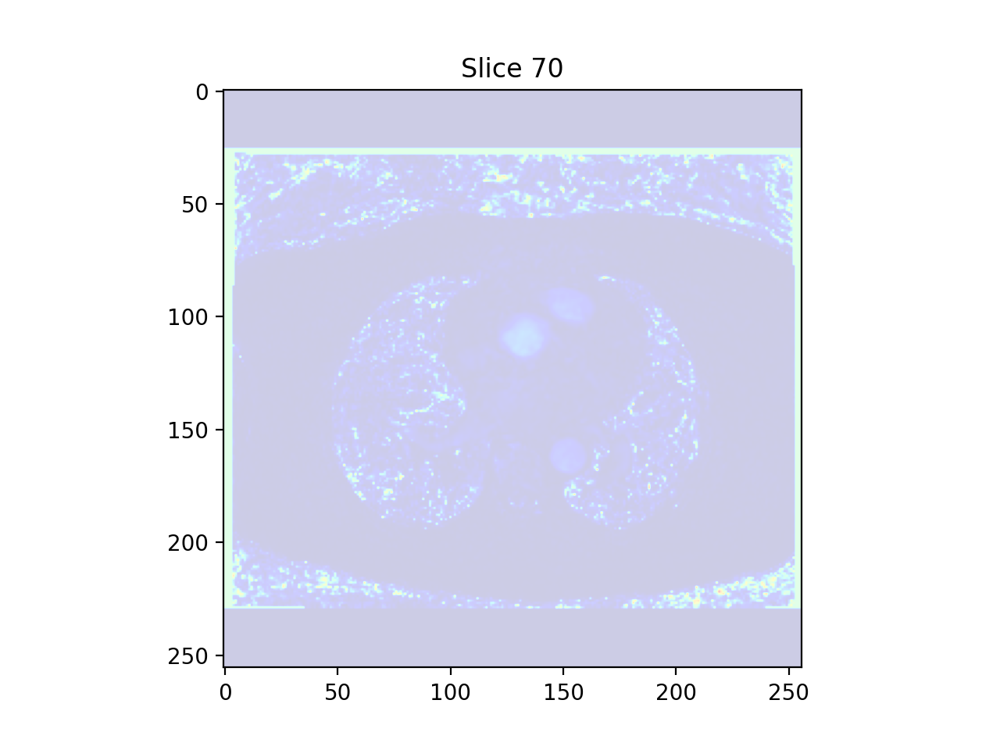

<IPython.core.display.Javascript object>


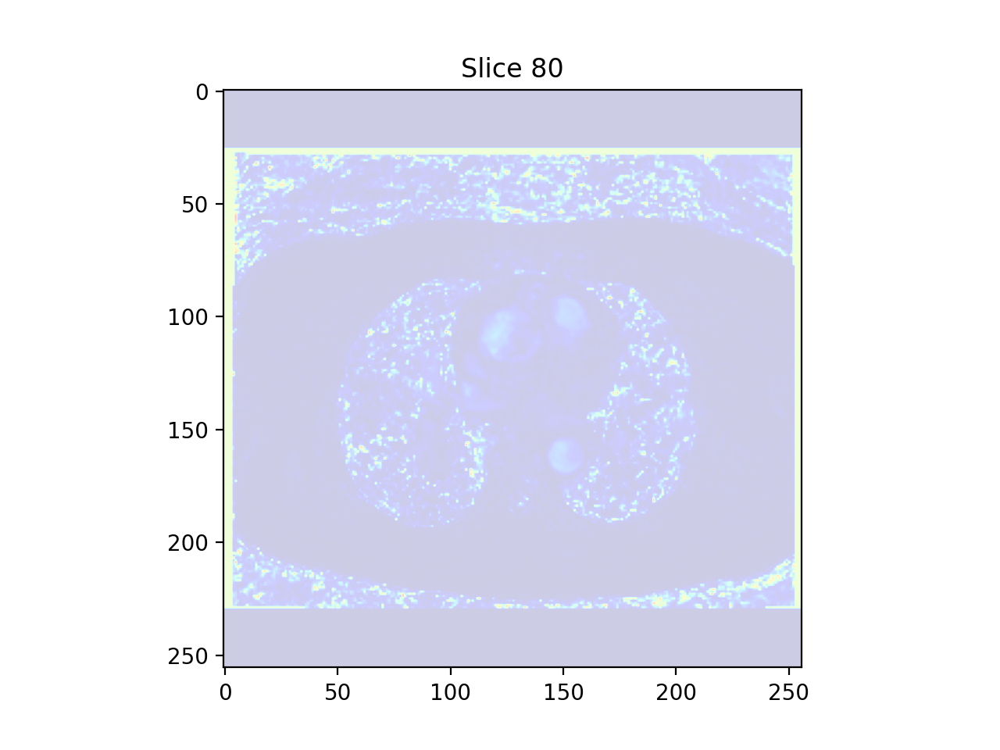

<IPython.core.display.Javascript object>


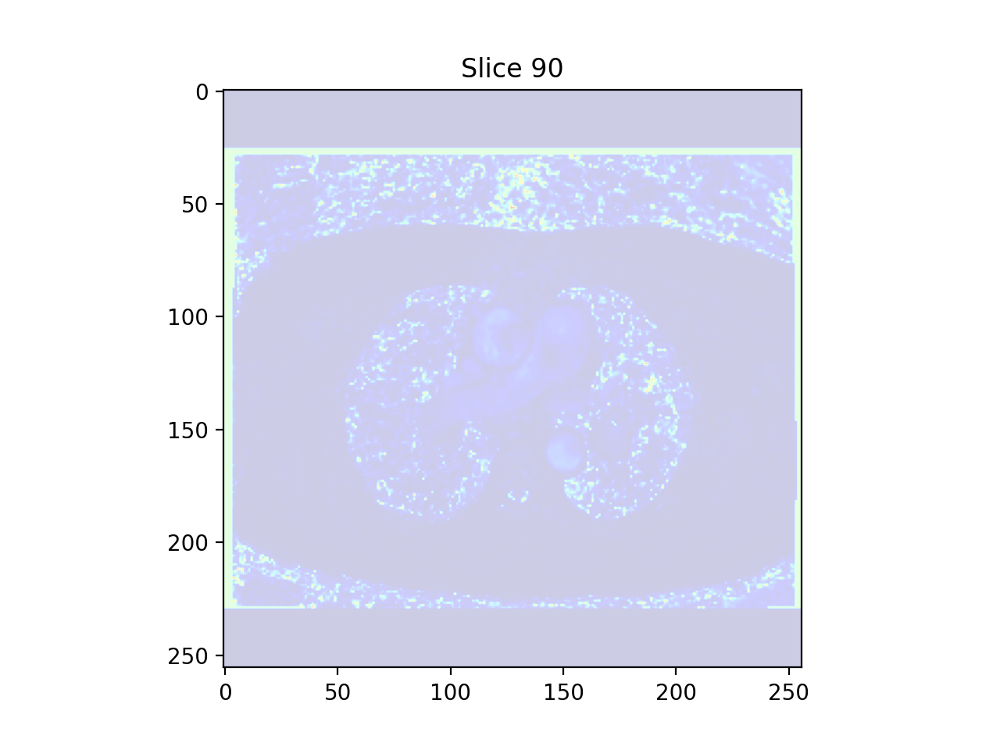

<IPython.core.display.Javascript object>


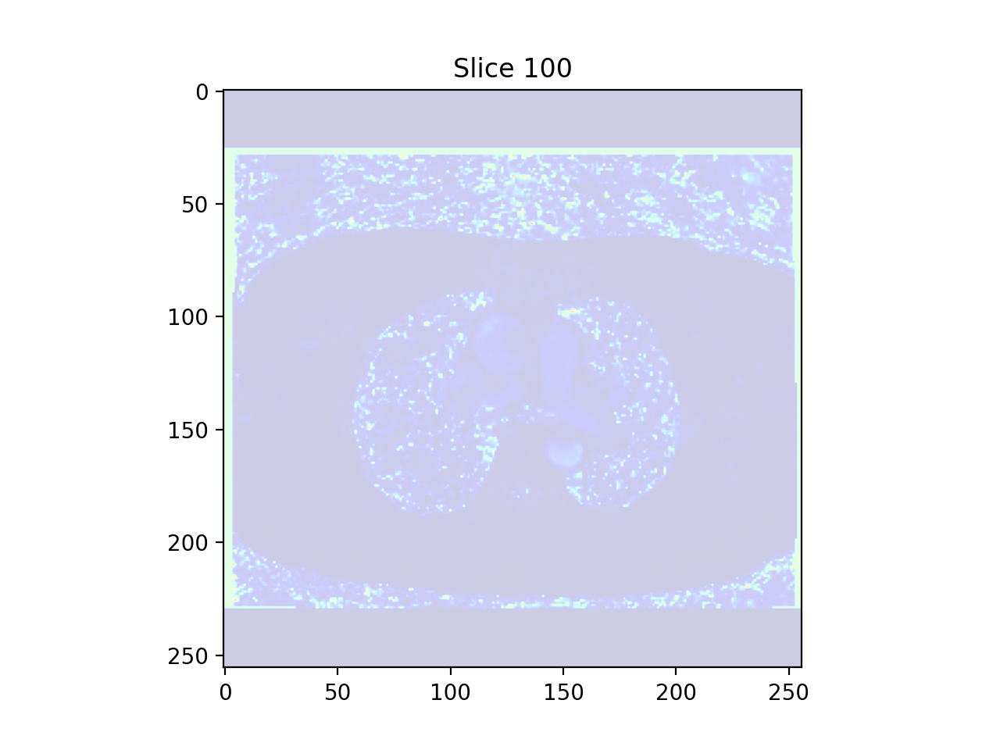

<IPython.core.display.Javascript object>


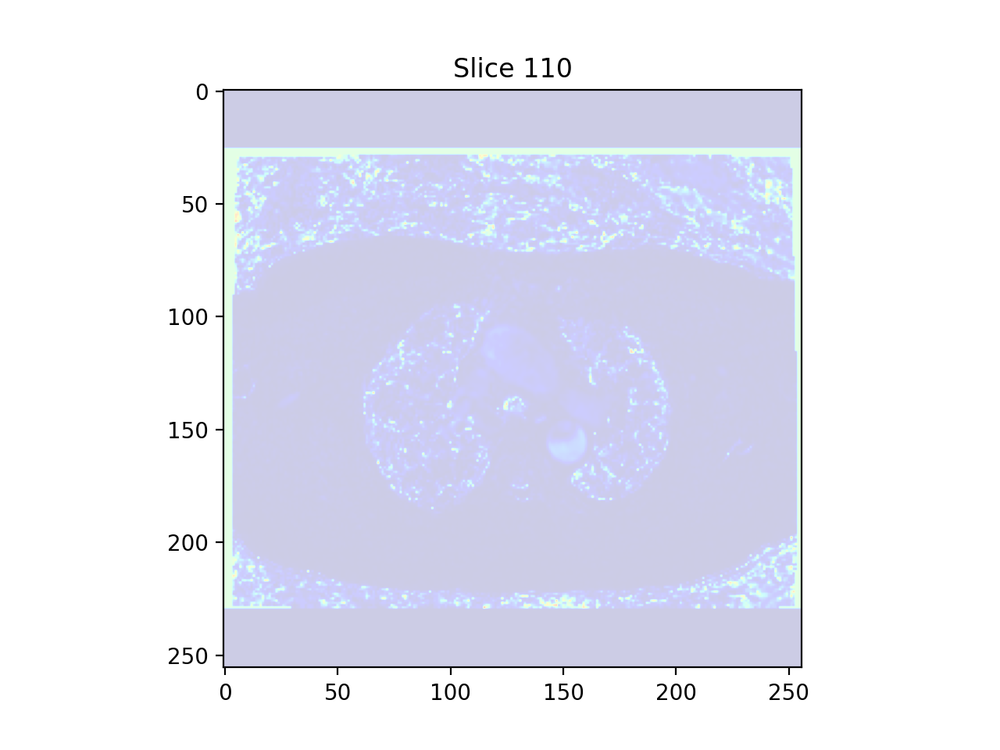

<IPython.core.display.Javascript object>


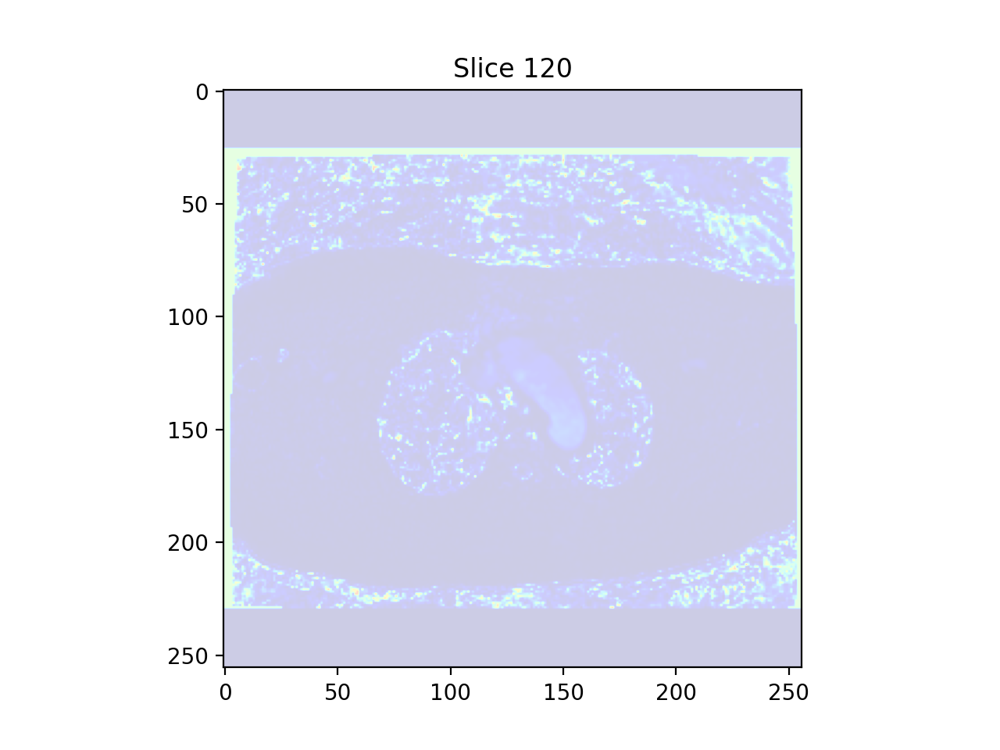

<IPython.core.display.Javascript object>


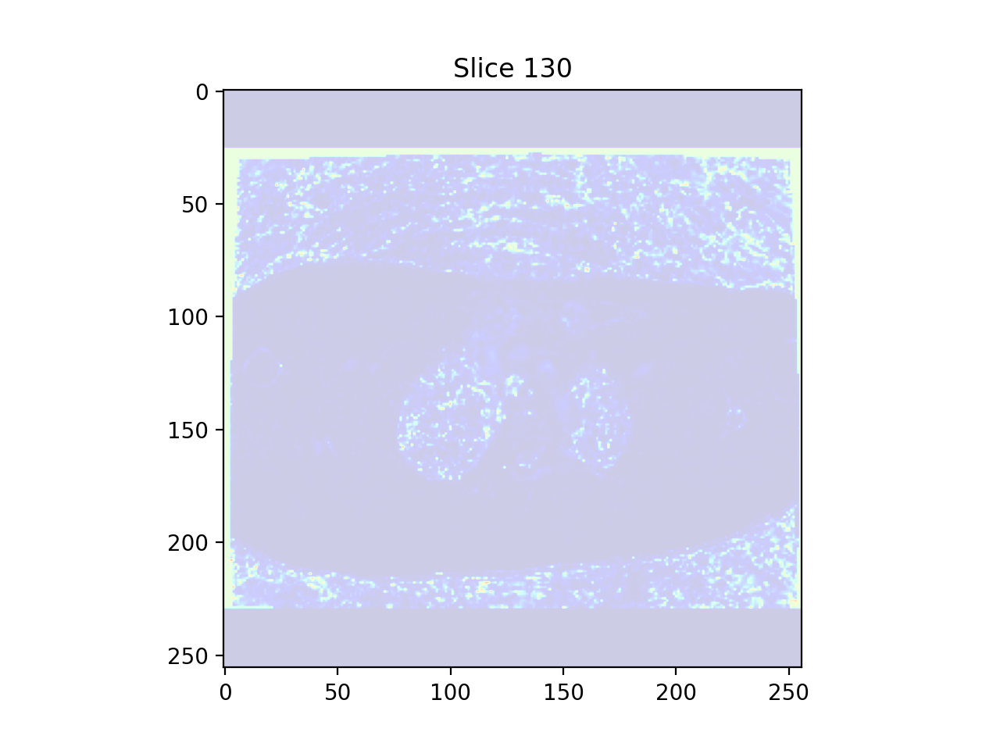

<IPython.core.display.Javascript object>


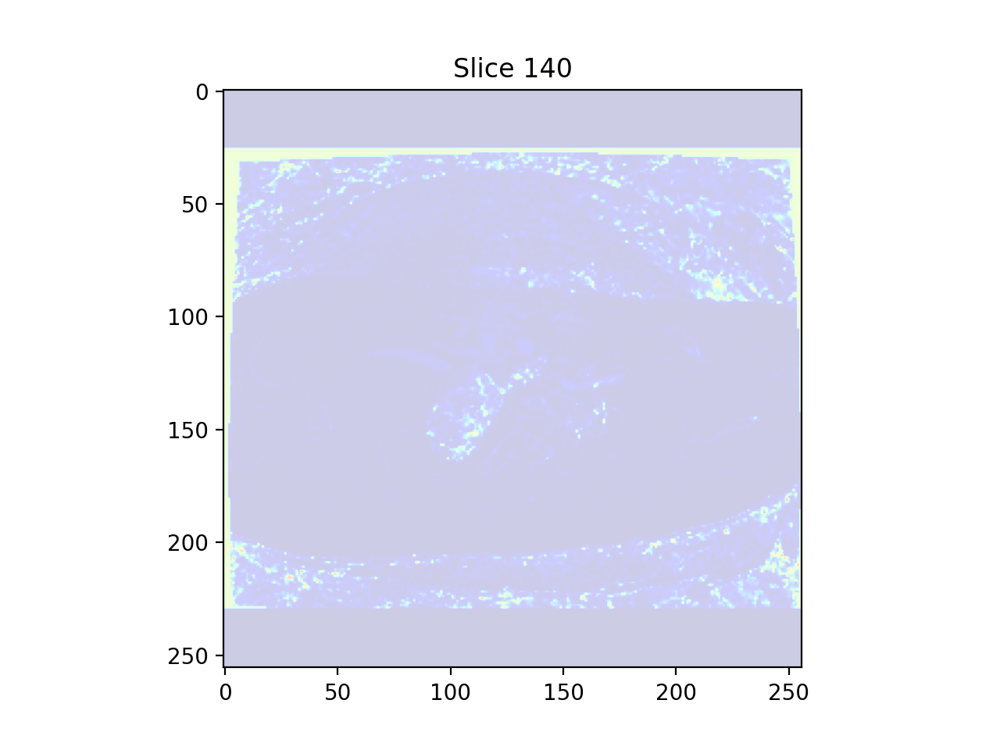

<IPython.core.display.Javascript object>


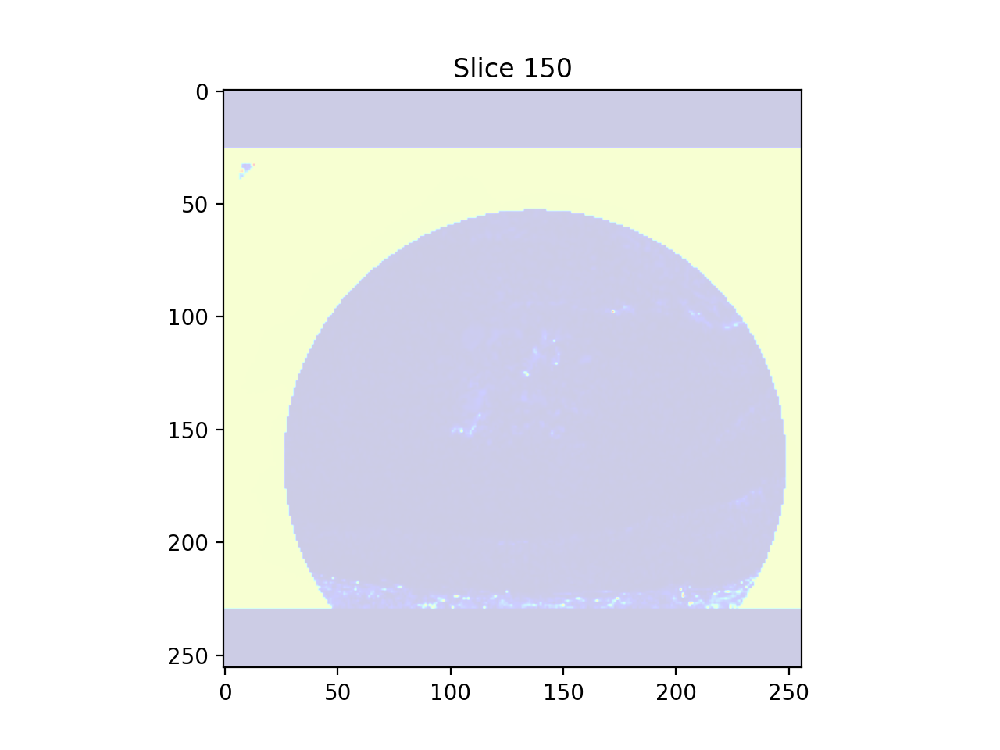

In [19]:
try:
    img = outh5[key]
    time = 5
    spd = np.sqrt(img[..., time, 1].astype('float')**2 + img[..., time, 2].astype('float')**2 + img[..., time, 3].astype('float')**2)
#     spd = np.sqrt(ecc_holder[..., time, 1-1].astype('float')**2 + ecc_holder[..., time, 2-1].astype('float')**2 + ecc_holder[..., time, 3-1].astype('float')**2)

    plt.figure()
    plt.suptitle(key)
    if 'A_flow_old' in metadict[key]:
        plt.suptitle(key + ' - flipped')

    print(key)
    print(metadict[key]['A_flow'])

    z_total = img.shape[2]

    for z in range(0,z_total,10):
        plt.figure()
        plt.title(f'Slice {z}')
#         plt.imshow(img[:, :, z, time, 0], cmap='gray')
        plt.imshow(spd[:, :, z], cmap='jet', alpha=0.2)
        plt.show()

except:
    traceback.print_exc()
    pass

In [ ]:
### imaging parameters (table 2)

comppaths = '/home/ayeluru/4d-flow-automation/bigchonk/component_paths'
magpaths = '/home/ayeluru/4d-flow-automation/bigchonk/magdata'

In [ ]:
training_pids = ['Achelney', 'Aknierum', 'Alernscet', 'Alokin', 'Askodad', 'Bafoha', 'Bakido', 'Baquague', 'Basugrug', 'Berite', 'Blapomo', 'Blolibie', 'Bojabo', 'Bosodi', 'Botrise', 'Botuepi', 'Cararklurn', 'Chiduplo', 'Ciphiscap', 'Criheno', 'Cugatu', 'Dahafu', 'Dasleli', 'Datiploo', 'Dehujar', 'Dequesan', 'Dichegi', 'Dihoori', 'Dosebom', 'Douswode', 'Drabrinit', 'Drunsterdoch', 'Dufehi', 'Dunurul', 'Dusebnak', 'Ebsabgor', 'Enbrounkush', 'Erimor', 'Ethimin', 'Fagasu', 'Fakeyak', 'Famtefem', 'Faquija', 'Feehasep', 'Fequaque', 'Fesemab', 'Filoje', 'Fodosni', 'Fohimut', 'Funemu', 'Gadeeji', 'Gadefa', 'Gapinet', 'Gepabruem', 'Gifodien', 'Giruca', 'Gojaje', 'Gonufi', 'Goucoswi', 'Goulaja', 'Gralalink', 'Grinafru', 'Gririeyoze', 'Guefackong', 'Hajegdof', 'Heenknuepan', 'Heyatam', 'Hiquafay', 'Hustesooch', 'Ifamar', 'Ifquanig', 'Igongep', 'Imangam', 'Ipayik', 'Ipunkan', 'Ixokog', 'Jabepoun', 'Jacado', 'Jafuju', 'Jakaloum', 'Japiefie', 'Jibliqui', 'Jilougey', 'Kalowee', 'Kaluqua', 'Kayalop', 'Kebornin', 'Keceifi', 'Keldusif', 'Kesalo', 'Kihoukup', 'Klegagay', 'Kuquiha', 'Kusepee', 'Leebaswa', 'Leerscoopub', 'Lepori', 'Lequego', 'Leyirous', 'Litepoon', 'Lucathi', 'Luducu', 'Lumelub', 'Mefase', 'Mibaneze', 'Migoplo', 'Mitora', 'Muedelig', 'Mujaley', 'Nadinmun', 'Naquodas', 'Necegeb', 'Nedousu', 'Negejik', 'Nemaho', 'Netaklay', 'Nilirnay', 'Nimotsuer', 'Nitheci', 'Nodituen', 'Noobluefar', 'Nopigo', 'Nosatof', 'Nurburel', 'Obfalpod', 'Obmofook', 'Omubag', 'Oseskey', 'Pikcelak', 'Pisceembok', 'Pitohun', 'Pogheken', 'Potrostri', 'Pusipdrem', 'Quaseho', 'Quebida', 'Quebike', 'Quecigal', 'Queninuth', 'Quepoucood', 'Quequofe', 'Quibloyag', 'Quify', 'Ribiri', 'Rosomo', 'Ruetica', 'Rujehi', 'Sarnagnam', 'Scasyeg', 'Scekoogar', 'Sesgofek', 'Shelufi', 'Shibrooflal', 'Slapeeme', 'Snubroset', 'Sonapoo', 'Souremat', 'Srupode', 'Strabukiem', 'Teecunep', 'Thigruhi', 'Tijune', 'Ubedeb', 'Ugerem', 'Utusin', 'Vabriraf', 'Vahapug', 'Wumode', 'Yireesut', 'Zutedouch']
validation_pids = ['Adbankad', 'Begaca', 'Dipadisk', 'Epdrackgig', 'Flotulo', 'Gigoro', 'Gufeken', 'Incepey', 'Jolanu', 'Kobese', 'Magekof', 'Nakodi', 'Nobiquer', 'Phomudef', 'Quegazer', 'Rupulcof', 'Stipemaf', 'Voufafu']
testing_pids = ['Besapol','Deefegi','Dehithu','Dukasa','Fegaygun','Fenoopub','Fratalooy','Gajefe','Giretap','Goxankot','Hetero','Hudutre','Jefoje','Kohugonk','Mifoyeg','Motale','Mozufuck','Narikag','Natotag','Noukumu','Nuebafru','Okiegop','Quiflula','Quisculjug','Repusug','Retasu','Sacureed','Scoostepip','Semagon','Sifaci','Tasnicu','Tesrenil','Tibomol','Tiheerien','Urquidash']

print(training_pids)
print(len(training_pids))
print()

print(validation_pids)
print(len(validation_pids))
print()

print(testing_pids)
print(len(testing_pids))
print()

In [ ]:
os.listdir(comppaths)

In [ ]:
with open(os.path.join(comppaths,'Achelney'+'.pkl'), "rb") as input_file:   
    patpkl = pickle.load(input_file)

In [ ]:
pid = 'Begaca'
currwalk = os.path.join(magpaths,pid)

for root, dirs, files in os.walk(currwalk):
    for file in files:
        print(os.path.join(root,file))
        dicom = pydicom.dcmread(os.path.join(root,file))
        break

In [ ]:
for key in dicom.dir():
    try:
        if key == 'PixelData':
            continue
        element = dicom[key]
        print(f"{key}: {element.value}")
    except Exception as e:
        print(f"Error reading {key}: {e}")


In [ ]:
print(dicom[0x0019, 0x10B3].value, dicom[0x0043,0x1030].value)

In [ ]:
for key in dicom:
    print(key)

In [ ]:
for key in dicom.dir():
    try:
        if key == 'PixelData':
            continue
        element = dicom[key]
#         print(f"{key}: {element.value}")
        print(f"Tag: {element.tag}, Description: {element.description()}, Value: {element.value}")
    except Exception as e:
        print(f"Error reading {key}: {e}")


In [ ]:
for element in dicom:
    try:
        print(f"Tag: {element.tag}, Description: {element.description()}, Value: {element.value}")
        
    except Exception as e:
        print(f"Tag: {element.tag}, Description: {element.description()}, Error: {e}")
